In [1]:
import pandas as pd 
import numpy as np
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

In [2]:
data1 = pd.read_csv('OvershootingCells.csv')
data2 = pd.read_csv('UTILIZATIONandDROPS.csv')

In [3]:
Data = {'ServiceDropRate': data2['Service Drop Rate (All)(%)'].to_list(),'NameOfCell': data2['Cell Name'].to_list()}
df = pd.DataFrame(Data,columns=['NameOfCell','ServiceDropRate'])

In [4]:
new_df=data1.merge( df.set_index('NameOfCell'), on='NameOfCell')

In [6]:
new_df.columns

Index(['NameOfEnodB_x', 'NameOfCell', 'ID-OfLocalCell', 'MaxCounter',
       'MinDistance', 'MaxDistance', 'Cell_Type', 'DISTANCE_Threshold',
       'AvgSiteToSiteDistance', 'MinOvershoot_Idicator',
       'MaxOvershoot_Idicator', 'OvershootingOnDISTANCE_Threshold',
       'OvershootingOnMaxIdicator', 'ServiceDropRate'],
      dtype='object')

In [5]:
new_df.to_csv('Drop_OVERSHOOTING.csv', index=False, index_label=False)

In [2]:
NEW=pd.read_csv('Drop_OVERSHOOTING.csv')

In [4]:
data = NEW.filter(['MaxOvershoot_Idicator','ServiceDropRate'],axis=1)

In [3]:
NEW.dropna(inplace=True)

In [5]:
NEW.isnull().sum()

NameOfEnodB_x                       0
NameOfCell                          0
ID-OfLocalCell                      0
MaxCounter                          0
MinDistance                         0
MaxDistance                         0
Cell_Type                           0
DISTANCE_Threshold                  0
AvgSiteToSiteDistance               0
MinOvershoot_Idicator               0
MaxOvershoot_Idicator               0
OvershootingOnDISTANCE_Threshold    0
OvershootingOnMaxIdicator           0
ServiceDropRate                     0
dtype: int64

In [20]:
data['MaxOvershoot_Idicator'][0]

0.3518695237269021

In [ ]:
#df3 = df3.astype({'y': 'float'})

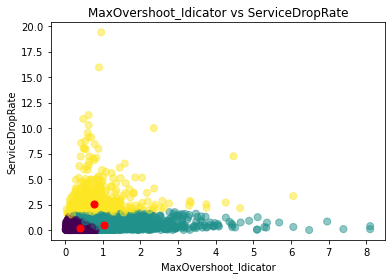

In [25]:
kmeans = KMeans(n_clusters=3).fit(data)
centroids = kmeans.cluster_centers_
data['cluster_num'] = pd.Series((kmeans.labels_)+1, index=data.index)

plt.scatter(data['MaxOvershoot_Idicator'], data['ServiceDropRate'], c= kmeans.labels_.astype(float), s=50, alpha=0.5)
plt.scatter(centroids[:, 0], centroids[:, 1], c='red', s=50)
plt.title('MaxOvershoot_Idicator vs ServiceDropRate')
plt.xlabel('MaxOvershoot_Idicator')
plt.ylabel('ServiceDropRate')
plt.show()

In [24]:
centroids = kmeans.cluster_centers_
for i in range(kmeans.n_clusters):
    print(centroids[i])

[1.03579175 0.53569295]
[0.40411896 0.21669643]
[0.75728662 2.54319494]


In [23]:
from numpy import where
num_Of_Values_in_Cluster = [] 
for i in range(kmeans.n_clusters):
    num_Of_Values_in_Cluster.append(len(where(kmeans.labels_ == i)[0]))
num_Of_Values_in_Cluster  

[7073, 24649, 970]

In [7]:
len(data)

32692

In [6]:
def ther_index (data):
    list1=[]
    for i in range(0,len(data)):
        if (int(data.iloc[i]['MaxOvershoot_Idicator'])>=2 and int(data.iloc[i]['ServiceDropRate'])>=2.0):
            list1.append(i)
    return list1    


In [7]:
y=ther_index(NEW)

In [8]:
df2=pd.DataFrame()
x1=[];y1=[];cell=[]
for i in (y):
    cell.append(NEW.iloc[i]['NameOfCell'])
    x1.append(NEW.iloc[i]['MaxOvershoot_Idicator'])
    y1.append(NEW.iloc[i]['ServiceDropRate'])
df2.insert(0, 'NameOfCell', cell, True)   
df2.insert(1, 'MaxOvershoot_Idicator', x1, True)
df2.insert(2, 'ServiceDropRate', y1, True)    

In [10]:
df2.to_csv('OvershootingWith_HighDrop.csv', index=False, index_label=False)

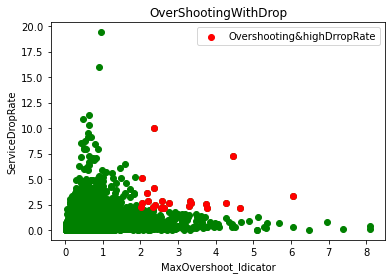

In [13]:
# plotting dataset
plt.scatter(NEW.loc[:,'MaxOvershoot_Idicator'], NEW.loc[:,'ServiceDropRate'],color = "green")

for j,i in enumerate(y):
    x2 = NEW.iloc[i]['MaxOvershoot_Idicator']
    y2 = NEW.iloc[i]['ServiceDropRate']
    if j==0:
        plt.scatter(x2, y2,color = "red",label='Overshooting&highDrropRate')
    else:
        plt.scatter(x2, y2, color = "red") 
plt.title("OverShootingWithDrop")
plt.xlabel("MaxOvershoot_Idicator")
plt.ylabel("ServiceDropRate")
plt.legend()
plt.show()        